In [105]:
pip install lime

In [106]:
import pandas as pd
df = pd.read_csv("/content/Camel_new.csv")
df.head()

,title,description,label
0,FileConfigureTest can't pass in Windows box,Because of the File.separator is different bet...,0
1,Throw Useful Exception on No TypeConverter Ava...,When there is no type converter available an N...,0
2,Most recent snapshot requires ActiveMQ,This may be moot given the projects' relations...,0
3,JMSXGroupID is not copied across ActiveMQ endp...,See thread: http://www.nabble.com/MethodName-i...,0
4,enable polling via the http component,enable polling via the http component,0


In [107]:
# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,auc, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix,f1_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# NLP
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
import re

# Warning
import warnings
warnings.filterwarnings('ignore')

Train and Test CSV files

In [108]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your CSV file into a pandas DataFrame
data = pd.read_csv("/content/Camel_new.csv")

# Split the data into features (X) and target variable (y) assuming the last column is the target variable
X = data.iloc[:, :-1]  # Features
y = data.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Concatenate features and target variable for training and testing sets
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Save the training and testing data to CSV files
train_data.to_csv("train.csv", index=False)
test_data.to_csv("test.csv", index=False)


In [109]:
# Loading train data
train_df = pd.read_csv('/content/train.csv')
print(f'Train data shape: {train_df.shape}')
train_df.head()

Train data shape: (800, 3)


,title,description,label
0,Synchronous mode should handle exceptions bein...,Camel MINA in synchronous mode (InOut exchange...,0
1,camel-core-xml - Add getter/sett for endpoints,We have listed @XmlElement(name = 'endpoint' ...,0
2,Do not print javax.jms.Message in toString in ...,See nabblehttp://camel.465427.n5.nabble.com/Ex...,0
3,Mail component issue with starttls option,The problem occurs when I read from a pop3 end...,0
4,camel-sftp's stepwise behavior to walk up and ...,I am having a directory traversal problem usin...,0


In [110]:
# Loading test data
test_df = pd.read_csv('/content/test.csv')
print(f'Test data shape: {test_df.shape}')
test_df.head()

Test data shape: (200, 3)


,title,description,label
0,Update archetypes to use new descriptor format,Camel archetypes use the old descriptor format...,0
1,antInclude support for case insensitive patterns,antIncude patterns are case sensitive. I need ...,0
2,Spring security example does not work,When you try to run the spring security exampl...,1
3,Exeptions cannot be propagated to the parent r...,Here is unit test that demonstrates the proble...,0
4,Support for Binary Files in HttpProducer,Presently the HTTP Component doesn't support ...,0


In [111]:
# Duplicates check
train_df.duplicated().sum()

0

In [112]:
# Data types check
train_df.dtypes

title          object
description    object
label           int64
dtype: object

In [113]:
# Missing values check
print(f'Missing values in train data:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data:\n{test_df.isnull().sum()}')

Missing values in train data:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data:
title          0
description    0
label          0
dtype: int64


In [114]:
import pandas as pd

# Assuming you have already loaded your train and test DataFrames as train_df and test_df

# Remove missing values from the train DataFrame
train_df = train_df.dropna()

# Remove missing values from the test DataFrame
test_df = test_df.dropna()

# Check if missing values are removed
print(f'Missing values in train data after removal:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data after removal:\n{test_df.isnull().sum()}')

Missing values in train data after removal:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data after removal:
title          0
description    0
label          0
dtype: int64


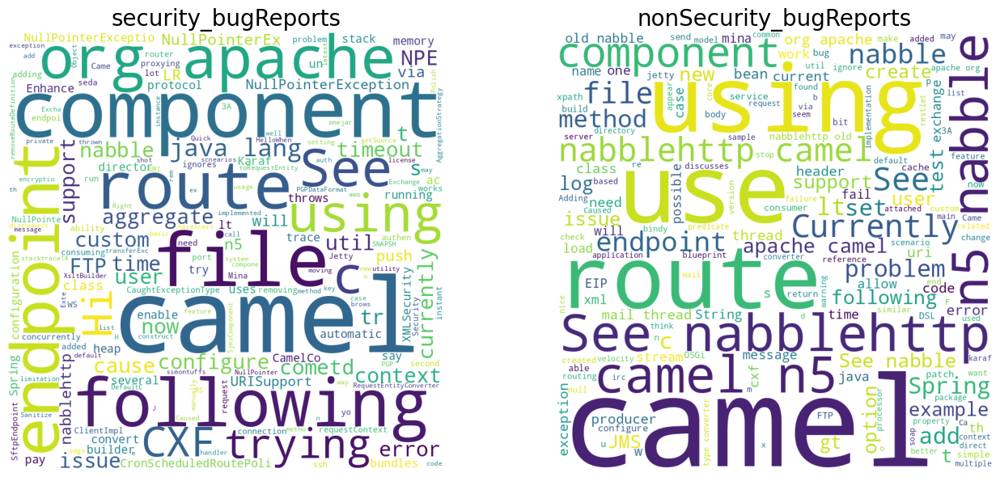

In [115]:
# Plotting wordclouds
stopwords = set(STOPWORDS)

security_bugReports = train_df['description'][train_df['label']==1].to_string()
wordcloud_negative = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(security_bugReports)

nonSecurity_bugReports = train_df['description'][train_df['label']==0].to_string()
wordcloud_positive = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(nonSecurity_bugReports)

# Plotting the WordCloud images
plt.figure(figsize=(14, 6), facecolor = None)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_negative)
plt.axis("off")
plt.title('security_bugReports', fontdict={'fontsize': 20})

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_positive)
plt.axis("off")
plt.title('nonSecurity_bugReports', fontdict={'fontsize': 20})

plt.tight_layout()
plt.show()

Data Preprocessing

In [116]:
# Train-Test Splitting
X = train_df.drop(columns=['label'])
y = train_df['label']
test = test_df
print(X.shape, test.shape, y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(800, 2) (200, 3) (800,)
(640, 2) (160, 2) (640,) (160,)


In [117]:
X_train.dtypes

title          object
description    object
dtype: object

Text Normalization

In [118]:
# Function to tokenize and clean the text
def tokenize_and_clean(text):
    # Changing case of the text to lower case
    lowered = text.lower()

    # Cleaning the text
    cleaned = re.sub('@user', '', lowered)

    # Tokenization
    tokens = word_tokenize(cleaned)
    filtered_tokens = [token for token in tokens if re.match(r'\w{1,}', token)]

    # Stemming
    stemmer = PorterStemmer()
    stems = [stemmer.stem(token) for token in filtered_tokens]
    return stems

**Vectorization**

In [119]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [120]:
# BOW Vectorization

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train['description'])
X_test_tfidf = tfidf_vectorizer.transform(X_test['description'])
print(X_train_tfidf.shape, X_test_tfidf.shape)

# TF-IDF Vectorization on full training data
tfidf_vectorizer_full = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_tfidf = tfidf_vectorizer_full.fit_transform(X['description'])
test_tfidf = tfidf_vectorizer_full.transform(test['description'])
print(X_tfidf.shape, test_tfidf.shape)

(640, 7701) (160, 7701)
(800, 9013) (200, 9013)


**SMOTE**

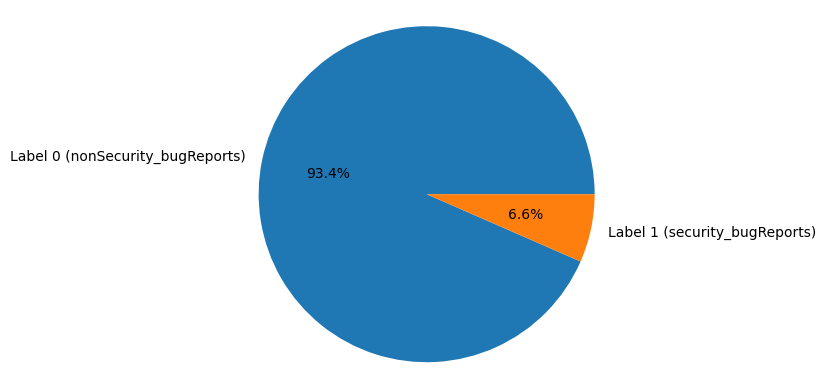

In [121]:
# Class Imbalance Check
plt.pie(y_train.value_counts(),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

(1196, 7701) (1196,)
(1490, 9013) (1490,)


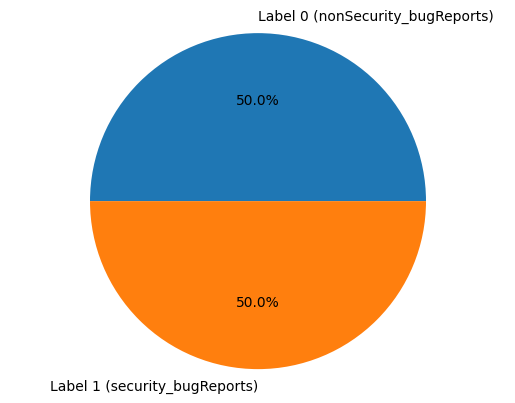

In [122]:
# SMOTE to deal with the class imbalance
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

ML **Modeling**

In [123]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [124]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.998, precision=0.997, recall=1.0, F1-Score=0.998, roc=0.998
Validation Scores: Accuracy=0.894, precision=0.25, recall=0.154, F1-Score=0.19, roc=0.557


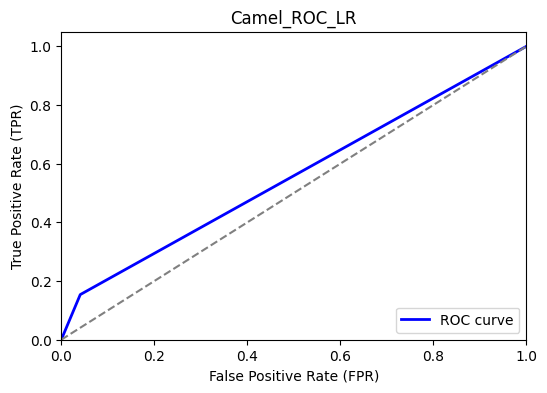

In [125]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_LR.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

--------------------------**LIME for Logistic Regression**----------------------

In [126]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [127]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1087


In [128]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [129]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [130]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.68620959 0.31379041]]

Explanation as a list of weighted features


[('Exchange', 0.1052982266354138),
 ('doCatch', -0.05578487235400134),
 ('local', 0.050379602186739605),
 ('use', -0.04048043412034894),
 ('copy', 0.0013892912606423397)]

In [131]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [132]:
exp.show_in_notebook(text=True)

In [133]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.977, precision=0.957, recall=1.0, F1-Score=0.978, roc=0.977
Validation Scores: Accuracy=0.812, precision=0.257, recall=0.692, F1-Score=0.375, roc=0.758


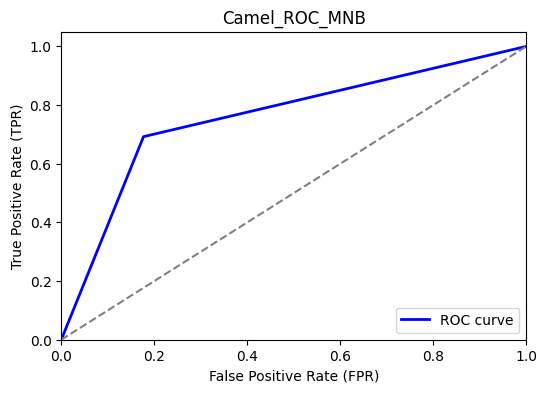

In [134]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_MNB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

--------------------------**LIME for Naive Bayes**----------------------

In [135]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [136]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1087


In [137]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [138]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [139]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.36071017 0.63928983]]

Explanation as a list of weighted features


[('local', 0.1111892120820629),
 ('doCatch', -0.11011108000764692),
 ('Exchange', 0.06688166435757516),
 ('copy', 0.04362803569244082),
 ('use', -0.02404904221106728)]

In [140]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [141]:
exp.show_in_notebook(text=True)

In [142]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.919, precision=0.0, recall=0.0, F1-Score=0.0, roc=0.5


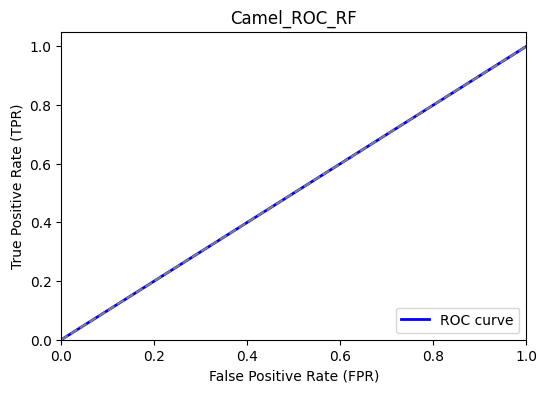

In [143]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_RF.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [144]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [145]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [146]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99 0.01]]

Explanation as a list of weighted features


[('use', 0.009979238693201258),
 ('TryProcessor', 1.3606843801837907e-06),
 ('local', 1.1341262508982272e-06),
 ('Do', 1.1198757958439657e-06),
 ('not', 9.604481353140571e-07)]

In [147]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [148]:
exp.show_in_notebook(text=True)

In [149]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.999, precision=1.0, recall=0.998, F1-Score=0.999, roc=0.999
Validation Scores: Accuracy=0.944, precision=0.833, recall=0.385, F1-Score=0.526, roc=0.689


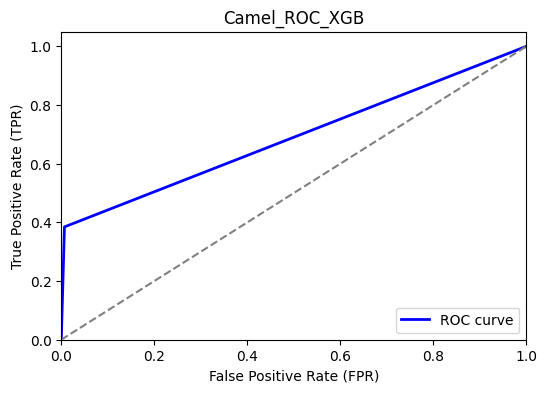

In [150]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_XGB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [151]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [152]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [153]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.995613   0.00438704]]

Explanation as a list of weighted features


[('Exchange', -0.0011311747631075238),
 ('use', 0.0005705988848337109),
 ('local', 3.608654659561174e-06),
 ('in', 3.231891880847797e-06),
 ('doCatch', 2.0539159612828685e-06)]

In [154]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [155]:
exp.show_in_notebook(text=True)

In [156]:
pip install lime

**SMOTE WITH 60:40 RATIO**

(956, 7701) (956,)
(1490, 9013) (1490,)


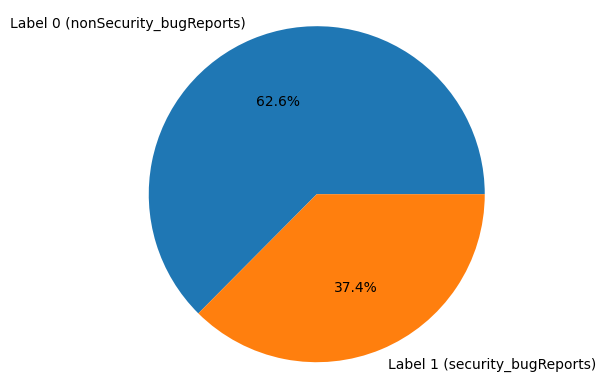

In [189]:
# SMOTE to deal with the class imbalance
smote = SMOTE(sampling_strategy=0.6)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

In [190]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [191]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.996, precision=0.994, recall=0.994, F1-Score=0.994, roc=0.996
Validation Scores: Accuracy=0.888, precision=0.0, recall=0.0, F1-Score=0.0, roc=0.483


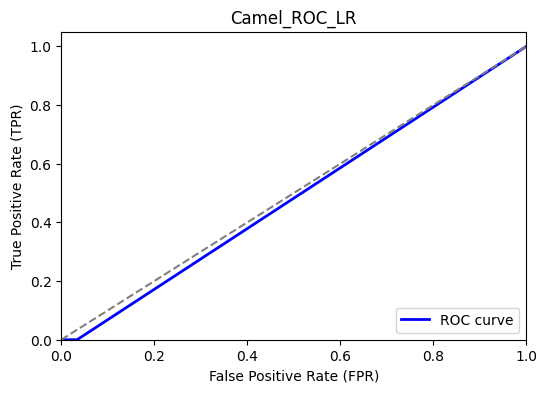

In [192]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_LR_r3.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Logistic Regression**---------------------

In [193]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [194]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

1087


In [195]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [196]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [197]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.73231504 0.26768496]]

Explanation as a list of weighted features


[('Exchange', 0.08864768584457045),
 ('doCatch', -0.04395264724894929),
 ('local', 0.039959228638359594),
 ('use', -0.032345277654932336),
 ('copy', -0.003966158177075181)]

In [198]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [199]:
exp.show_in_notebook(text=True)

In [200]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.994, precision=0.984, recall=1.0, F1-Score=0.992, roc=0.995
Validation Scores: Accuracy=0.9, precision=0.364, recall=0.308, F1-Score=0.333, roc=0.63


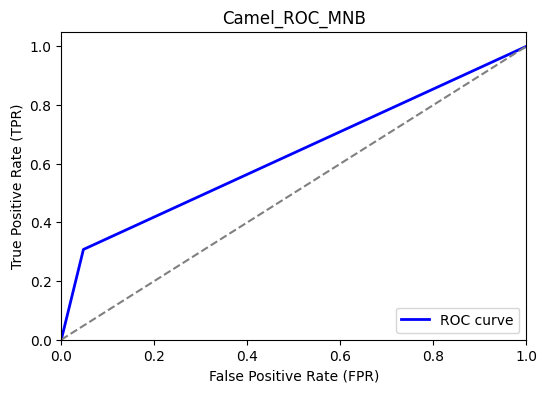

In [201]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_MNB_r3.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------------**lime for Naive Bayes**----------------------------

In [202]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [203]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [204]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.57877429 0.42122571]]

Explanation as a list of weighted features


[('local', 0.08336538089480655),
 ('doCatch', -0.054353566571045765),
 ('use', -0.04287240575861757),
 ('Exchange', 0.03731125186407853),
 ('copy', 0.006118291702496092)]

In [205]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [206]:
exp.show_in_notebook(text=True)

In [207]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.919, precision=0.0, recall=0.0, F1-Score=0.0, roc=0.5


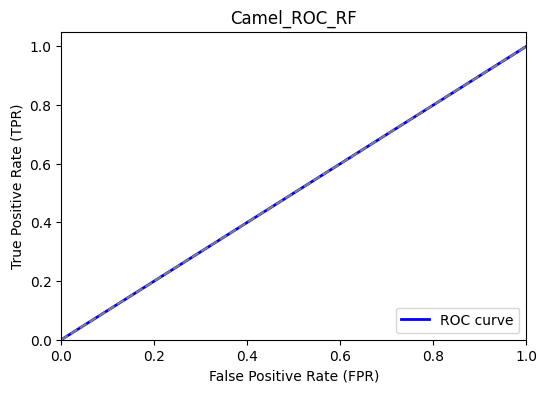

In [208]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_RF_r3.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [209]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [210]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [211]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.97 0.03]]

Explanation as a list of weighted features


[('use', 0.009981837460592212),
 ('local', 0.009981519071616922),
 ('copy', 0.009981503405899534),
 ('Do', 3.447159968129728e-06),
 ('TryProcessor', 3.037080496817607e-06)]

In [212]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [213]:
exp.show_in_notebook(text=True)

In [214]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.944, precision=0.833, recall=0.385, F1-Score=0.526, roc=0.689


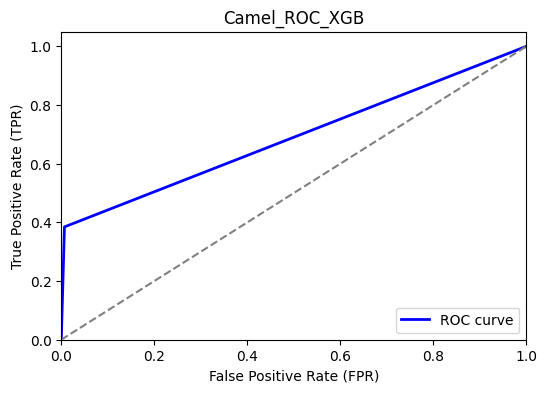

In [215]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Camel_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Camel_ROC_XGB_r3.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [216]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [217]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [218]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99428827 0.00571173]]

Explanation as a list of weighted features


[('use', -0.000873759007357863),
 ('Exchange', 0.0004366859596817928),
 ('TryProcessor', 9.362646045561529e-07),
 ('in', 7.591406492792175e-07),
 ('local', 7.497429940357127e-07)]

In [219]:
[test.title.iloc[idx]]

['TryProcessor - Do not use local copy Exchange in doCatch']

In [220]:
exp.show_in_notebook(text=True)